In [10]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm

In [11]:
from torchvision import transforms
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [3]:
import zipfile
import os

zip_path = "/content/Places2_simp_resit.zip"
extract_path = "/content/Places2_simp_ayush"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [65]:
import zipfile
import os

zip_path = "/content/test_set_resit.zip"
extract_path = "/content/test_set_dino"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

In [26]:
from torchvision.transforms.v2 import TrivialAugmentWide

transform_train =  transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(degrees=20),
    TrivialAugmentWide(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transforms_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [27]:
dataset_path = "/content/Places2_simp_ayush/Places2_simp"

dataset =  ImageFolder(root= dataset_path, transform= transform_train)
print(len(dataset))
print(dataset.classes)
print(len(dataset.classes))

40000
['airport_terminal', 'amphitheatre', 'amusement_park', 'art_gallery', 'bakery_shop', 'bar', 'bookstore', 'botanical_garden', 'bridge', 'bus_interior', 'butchers_shop', 'campsite', 'classroom', 'coffee_shop', 'construction_site', 'courtyard', 'driveway', 'fire_station', 'fountain', 'gas_station', 'harbour', 'highway', 'kindergarten_classroom', 'lobby', 'market_outdoor', 'museum', 'office', 'parking_lot', 'phone_booth', 'playground', 'railroad_track', 'restaurant', 'river', 'shed', 'staircase', 'supermarket', 'swimming_pool_outdoor', 'track', 'valley', 'yard']
40


In [66]:
test_dataset_path = "/content/test_set_dino/test_set_resit/India"
test_dataset = ImageFolder(root=test_dataset_path, transform=transforms_val)
test_dataloader = DataLoader(test_dataset, batch_size=10, shuffle=False)
test_class_names = test_dataset.classes
tesst_num_classes = len(test_class_names)
print(test_class_names)
print(tesst_num_classes)

['airport_terminal', 'amphitheatre', 'amusement_park', 'art_gallery', 'bakery_shop', 'bar', 'bookstore', 'botanical_garden', 'bridge', 'bus_interior', 'butchers_shop', 'campsite', 'classroom', 'coffee_shop', 'construction_site', 'courtyard', 'driveway', 'fire_station', 'fountain', 'gas_station', 'harbour', 'highway', 'kindergarten_classroom', 'lobby', 'market_outdoor', 'museum', 'office', 'parking_lot', 'phone_booth', 'playground', 'railroad_track', 'resturant', 'river', 'shed', 'staircase', 'supermarket', 'swimming_pool_outdoor', 'track', 'valley', 'yard']
40


In [29]:
from torch.utils.data import random_split

training_size = int(0.8 * len(dataset))
validation_size = len(dataset) - training_size

train_dataset, val_dataset = random_split(dataset, [training_size, validation_size],  generator=torch.Generator().manual_seed(40))

In [30]:
val_dataset.dataset.transform = transforms_val
train_dataLoader = DataLoader(train_dataset, batch_size=100, shuffle=False)
val_dataLoader = DataLoader(val_dataset, batch_size=100, shuffle=False)

Feature batch shape: torch.Size([100, 3, 224, 224])
Labels batch shape: torch.Size([100])


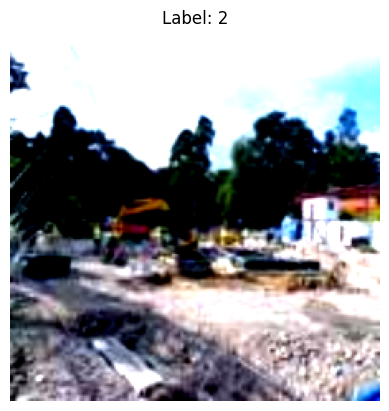

In [31]:
train_features, train_labels = next(iter(train_dataLoader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].permute(1, 2, 0)
img = img * 0.5 + 0.5
label = train_labels[0]
plt.imshow(img.numpy())
plt.title(f"Label: {label}")
plt.axis("off")
plt.show()

In [32]:
dinov2 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14').to(device)
dinov2.eval()
num_classes = len(dataset.classes)

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


In [33]:
writer = SummaryWriter("runs/svm_dinov2")

In [34]:
import numpy as np
def extract_features(dataloader):
  features_list=[]
  labels_list=[]
  with torch.no_grad():
    for features, labels in tqdm(dataloader):
      features = features.to(device)
      dino_features = dinov2.forward_features(features)["x_norm_clstoken"]
      features_list.append(dino_features.cpu().numpy())
      labels_list.extend(labels.numpy())

    features = np.concatenate(features_list, axis=0)
    labels = np.array(labels_list)
    return features, labels


In [36]:
X_train, y_train = extract_features(train_dataLoader)
X_validation, y_validation = extract_features(val_dataLoader)


100%|██████████| 80/80 [02:22<00:00,  1.78s/it]


In [67]:
X_test, Y_test = extract_features(test_dataloader)

100%|██████████| 38/38 [00:15<00:00,  2.50it/s]


In [47]:
from sklearn.svm import SVC
svm_clf = SVC(kernel='rbf', probability=True)
svm_clf.fit(X_train, y_train)

SVC(probability=True)

In [48]:
y_pred = svm_clf.predict(X_validation)
y_prob = svm_clf.predict_proba(X_validation)

In [49]:
from sklearn.metrics import accuracy_score, confusion_matrix, top_k_accuracy_score
top1_acc = accuracy_score(y_validation, y_pred) * 100
print(f"\nTop-1 Accuracy: {top1_acc:.2f}%")
top5_acc = top_k_accuracy_score(y_validation, y_prob, k=5) * 100
print(f"Top-5 Accuracy: {top5_acc:.2f}%")


writer.add_scalar("Accuracy/Top1", top5_acc, 0)
writer.add_scalar("Accuracy/Top5", top5_acc, 0)


Top-1 Accuracy: 80.59%
Top-5 Accuracy: 97.88%


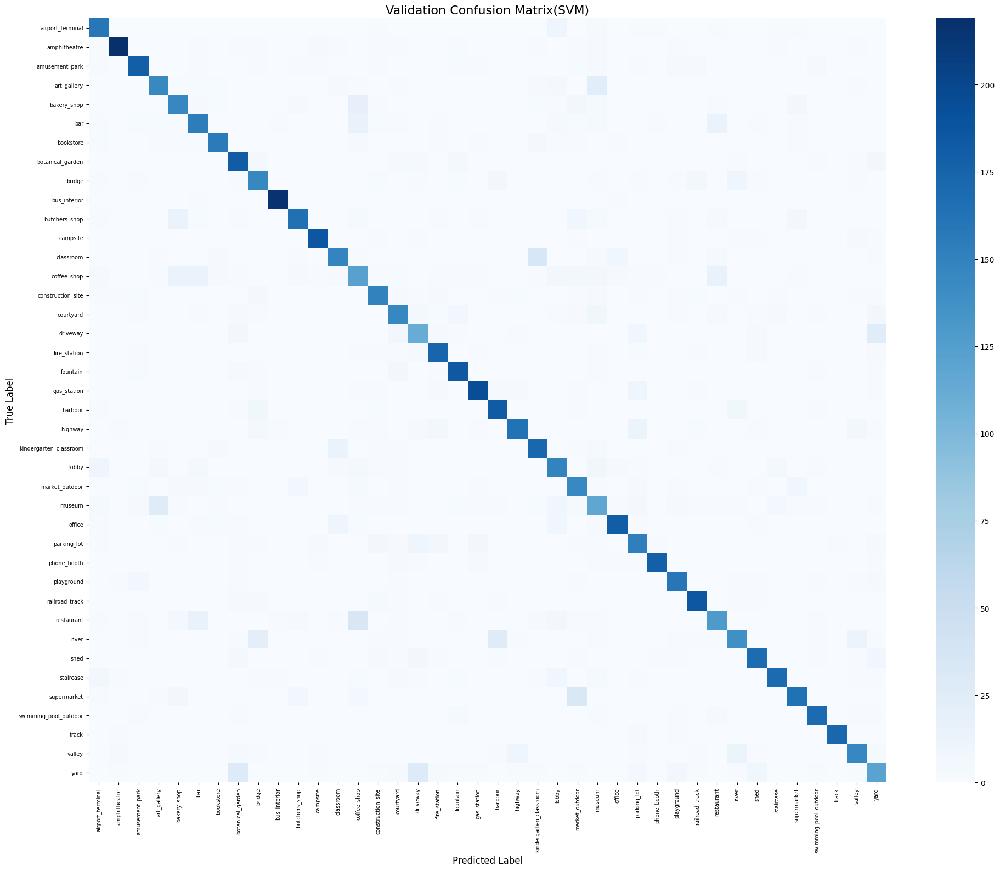

In [50]:
# Confusion matrix
cm = confusion_matrix(y_validation , y_pred)
plt.figure(figsize=(20, 16))
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues',
            xticklabels=val_dataLoader.dataset.dataset.classes,
            yticklabels=val_dataLoader.dataset.dataset.classes)


plt.xticks(rotation=90, fontsize=7)
plt.yticks(rotation=0, fontsize=7)
plt.title("Validation Confusion Matrix(SVM)", fontsize=16)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.tight_layout()
plt.savefig("validation_confusion_matrix_dinov2_svmkithkernelrbf.png")
plt.show()

writer.close()


In [68]:
y_test_pred = svm_clf.predict(X_test)
y_test_prob = svm_clf.predict_proba(X_test)

In [69]:
test_top1_acc = accuracy_score(Y_test, y_test_pred) * 100
print(f"\nTest Top-1 Accuracy: {test_top1_acc:.2f}%")
test_top5_acc = top_k_accuracy_score(Y_test, y_test_prob, k=5) * 100
print(f"Test Top-5 Accuracy: {test_top5_acc:.2f}%")

writer.add_scalar("Accuracy/Test Top1", test_top1_acc, 0)
writer.add_scalar("Accuracy/Test Top5", test_top5_acc, 0)


Test Top-1 Accuracy: 83.60%
Test Top-5 Accuracy: 97.09%


In [70]:
# Per-class accuracy (Test)
test_class_correct = np.zeros(len(test_class_names))
test_class_total = np.zeros(len(test_class_names))
for true_label, pred_label in zip(Y_test, y_test_pred):
    if true_label == pred_label:
        test_class_correct[true_label] += 1
    test_class_total[true_label] += 1

In [71]:
print("\nPer-class accuracy (Test):")
for i, class_name in enumerate(test_class_names):
    acc = 100 * test_class_correct[i] / test_class_total[i] if test_class_total[i] > 0 else 0
    print(f"{class_name:30s}: {acc:.2f}%")


Per-class accuracy (Test):
airport_terminal              : 100.00%
amphitheatre                  : 80.00%
amusement_park                : 100.00%
art_gallery                   : 66.67%
bakery_shop                   : 55.56%
bar                           : 60.00%
bookstore                     : 100.00%
botanical_garden              : 88.89%
bridge                        : 100.00%
bus_interior                  : 100.00%
butchers_shop                 : 100.00%
campsite                      : 85.71%
classroom                     : 100.00%
coffee_shop                   : 50.00%
construction_site             : 100.00%
courtyard                     : 60.00%
driveway                      : 100.00%
fire_station                  : 100.00%
fountain                      : 100.00%
gas_station                   : 100.00%
harbour                       : 90.00%
highway                       : 90.00%
kindergarten_classroom        : 25.00%
lobby                         : 90.00%
market_outdoor          

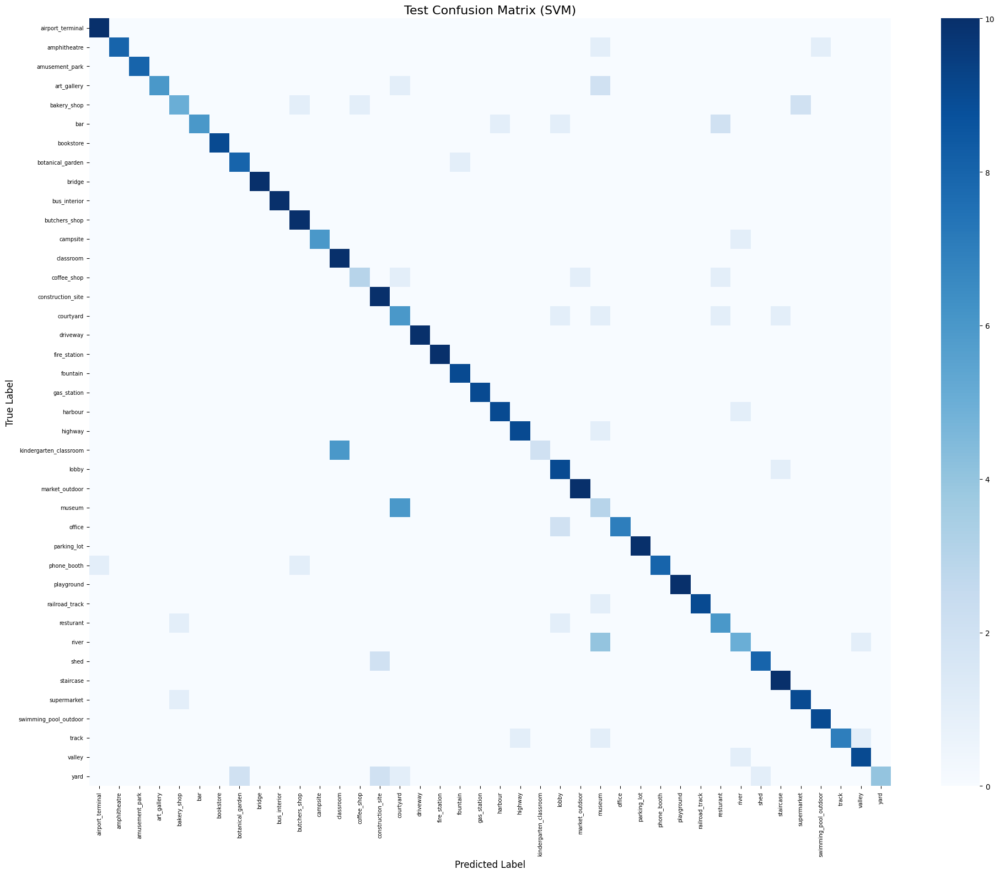

In [72]:
confusion_matrix_test = confusion_matrix(Y_test, y_test_pred)
plt.figure(figsize=(20, 16))
sns.heatmap(confusion_matrix_test, annot=False, fmt='d', cmap='Blues',
            xticklabels=test_class_names,
            yticklabels=test_class_names)
plt.xticks(rotation=90, fontsize=7)
plt.yticks(rotation=0, fontsize=7)
plt.title("Test Confusion Matrix (SVM)", fontsize=16)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.tight_layout()
plt.savefig("test_confusion_matrix_dinov2_svm_rbf.png")
plt.show()

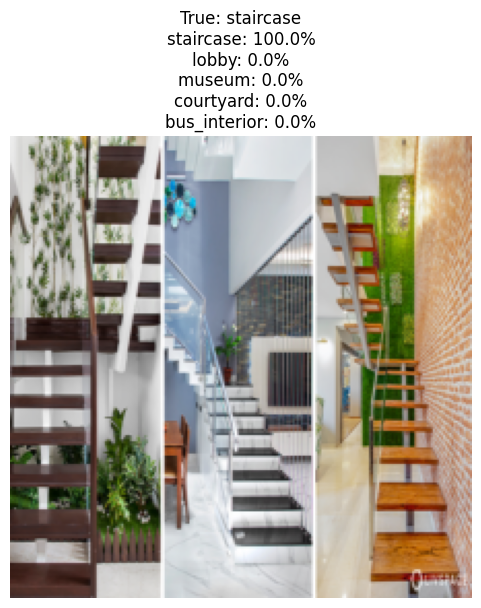

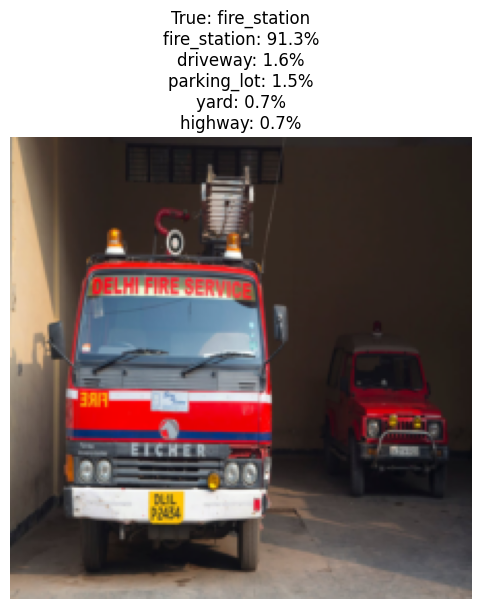

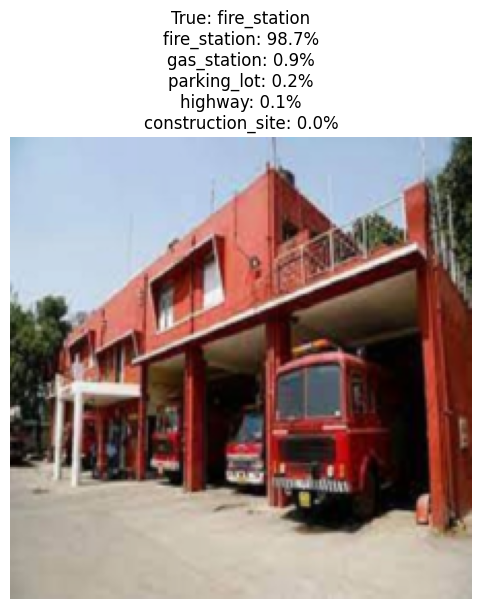

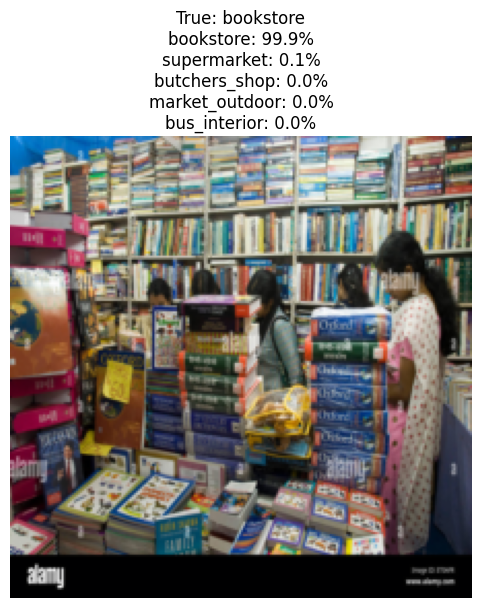

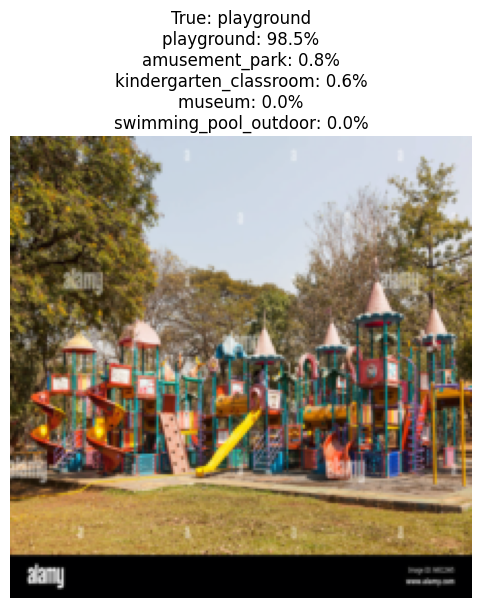

In [73]:
import random
import numpy as np
for index in random.sample(range(len(X_test)), 5):
    image_tensor, label = test_dataset[index]
    image = image_tensor.permute(1, 2, 0).numpy()

    image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    image = np.clip(image, 0, 1)

    probs = y_test_prob[index]
    top5_idx = np.argsort(probs)[-5:][::-1]
    top5_probs = probs[top5_idx]
    top5_labels = [test_class_names[i] for i in top5_idx]

    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"True: {test_class_names[label]}\n" +
              "\n".join([f"{top5_labels[i]}: {top5_probs[i]*100:.1f}%" for i in range(5)]))

    plt.show()

writer.close()

In [63]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 41028), started 0:00:44 ago. (Use '!kill 41028' to kill it.)

<IPython.core.display.Javascript object>